###FEATURE VECTORS 
By Chetna Agarwal

###IMAGE PYRAMIDS

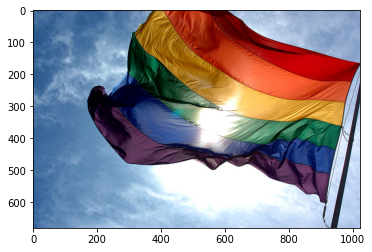

In [1]:
# Downsampling with image pyramids
# Read in an image and then construct and display a few layers of an image pyramid

import numpy as np
import matplotlib.pyplot as plt
import cv2
%matplotlib inline

image = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/rainbow_flag.jpg')

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image)

(0.0, 681.0)

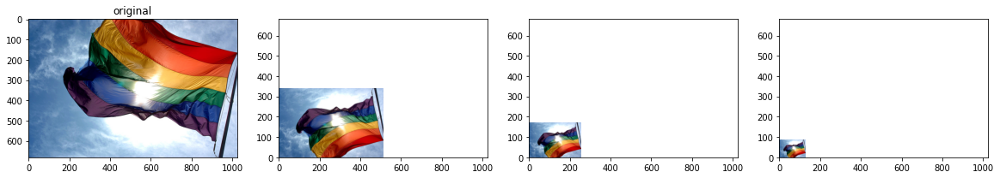

In [2]:
level_1 = cv2.pyrDown(image)
level_2 = cv2.pyrDown(level_1)
level_3 = cv2.pyrDown(level_2)

# Display the images
f, (ax1,ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(20,10))

ax1.set_title('original')
ax1.imshow(image)

ax2.imshow(level_1)
ax2.set_xlim([0, image.shape[1]])
ax2.set_ylim([0, image.shape[0]])

ax3.imshow(level_2)
ax3.set_xlim([0, image.shape[1]])
ax3.set_ylim([0, image.shape[0]])

ax4.imshow(level_3)
ax4.set_xlim([0, image.shape[1]])
ax4.set_ylim([0, image.shape[0]])


###ORIENTED FAST AND BRIEF ALGORITHM (ORB)

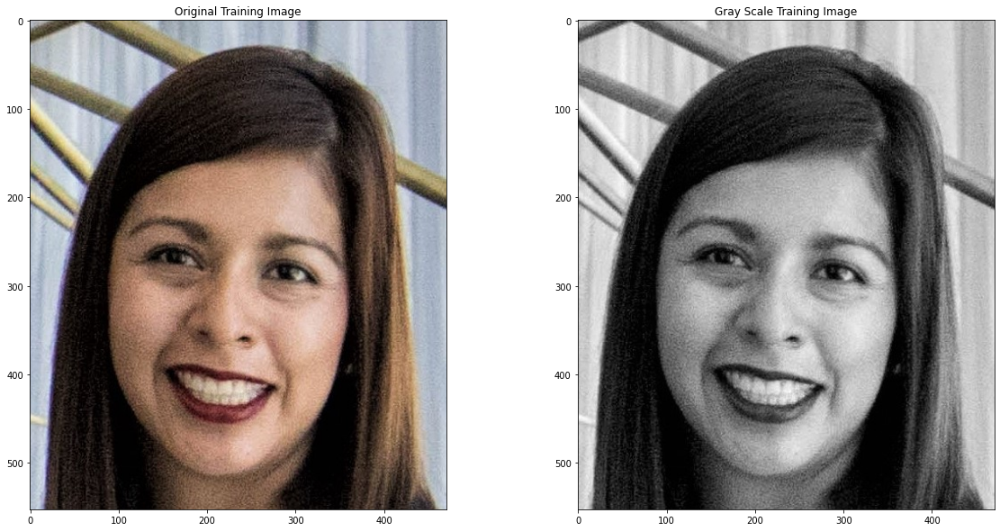

In [3]:
plt.rcParams['figure.figsize'] = [20, 10]
image = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')
training_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
training_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.subplot(121)
plt.title('Original Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Gray Scale Training Image')
plt.imshow(training_gray, cmap = 'gray')
plt.show()


LOCATING KEYPOINTS

In [4]:
# OPENCV's ORB class - to locate the keypoints and create their corresponding 
# ORB descriptors. 
# The first step in the ORB algorithm is to locate all the keypoints in the training
# image. After this, ORB creates their corresponding binary features vectors and groups 
# them together in the ORB descriptor.

# We'll use OpenCVs ORB class to locate the keypoints and create their corresponding
# ORB descriptor. The parameters of the ORB algo are setup using the ORB_create() 
# function. 

In [5]:
# deafult values of ORB_create() are:
# cv2.ORB_create(nfeatures = 500,
#               scaleFactor = 1.2,
#               nlevels = 8,
#               edgeThreshold = 31,
#               firstLevel = 0,
#               WTA_K = 2,
#               scoreType = HARRIS_SCORE,
#               patchSize = 31,
#               fastThreshold = 20)

# PARAMETERS :-
# 1. nfeatures (int) -> Determines the maximum number of features (keypoints) to locate.
# 2. scalefactor (float) -> Pyramid decimation ratio, must be greater than 1. ORB uses an 
# img pyramid to find features, therefore, we must provide the scale factor b/w each layer
# in the pyramid and the number of levels the pyramid has. A scale Factor = 2 means the 
# classical pyramid, where each level has 4X less pixels than the previous one. A big scale 
# factor will diminish the number of features found.
# 3. nlevels (int) -> the number of pyramid levels. the smallest level will have a linear
# size equal to input_image_linear_size/pow(scaleFactor, nlevels)
# 4. edgeThreshold (int) -> The size of the border where features are not detected. 
# Since the keypoints have a specific pixel size, the edges of images must be excluded 
# from the search. The size of the edgeThreshold should be equal to or greater than 
# the patchSize parameter.
# 5. firstLevel (int) -> This parameter allows you to determine which level should be 
# treated as the first level in the pyramid. It should be 0 in the current implementation. 
# Usually, the pyramid level with a scale of unity is considered the first level.
# 6. WTA_K (int) -> The number of random pixels used to produce each element of the oriented 
# BRIEF descriptor. The possible values are 2, 3, and 4, with 2 being the default value. 
# For example, a value of 3 means three random pixels are chosen at a time to compare 
# their brightness. The index of the brightest pixel is returned. Since there are 3 pixels, 
# the returned index will be either 0, 1, or 2.
# 7. scoreType (int) -> This parameter can be set to either HARRIS_SCORE or FAST_SCORE. 
# The default HARRIS_SCORE means that the Harris corner algorithm is used to rank features. 
# The score is used to only retain the best features. The FAST_SCORE produces slightly 
# less stable keypoints, but it is a little faster to compute.
# 8. patchSize (int) ->  Size of the patch used by the oriented BRIEF descriptor. Of 
# course, on smaller pyramid layers the perceived image area covered by a feature will 
# be larger.


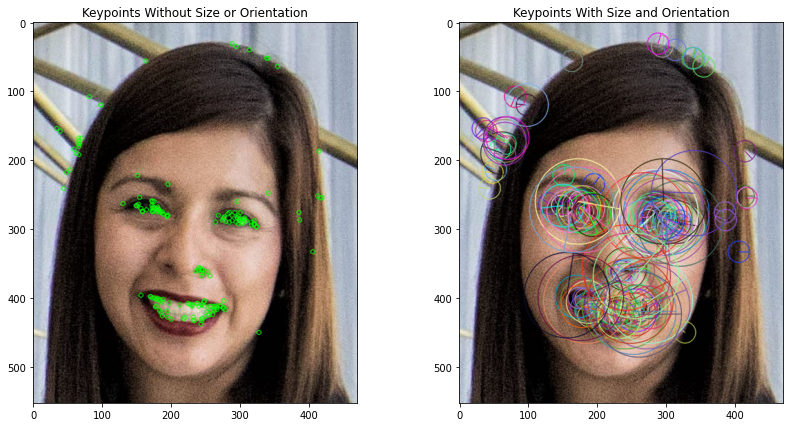


Number of keypoints Detected:  175


In [6]:
# Import copy to make copies of the training image
import copy

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(200, 2.0)

# Find the keypoints in the gray scale training image and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask.
keypoints, descriptor = orb.detectAndCompute(training_gray, None)

# Create copies of the training image to draw our keypoints on
keyp_without_size = copy.copy(training_image)
keyp_with_size = copy.copy(training_image)

# Draw the keypoints without size or orientation on one copy of the training image 
cv2.drawKeypoints(training_image, keypoints, keyp_without_size, color = (0, 255, 0))

# Draw the keypoints with size and orientation on the other copy of the training image
cv2.drawKeypoints(training_image, keypoints, keyp_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the image with the keypoints without size or orientation
plt.subplot(121)
plt.title('Keypoints Without Size or Orientation')
plt.imshow(keyp_without_size)

# Display the image with the keypoints with size and orientation
plt.subplot(122)
plt.title('Keypoints With Size and Orientation')
plt.imshow(keyp_with_size)
plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints Detected: ", len(keypoints))

In [7]:
# Each keypoint has a center, a size and an angle. The center determines the location of 
# each keypoint in an image; the size of each keypoint is determined by the patch size 
# used by BRIEF to create its feature vector; and the angle tells us the orientation 
# of the keypoint as determined by rBRIEF.

# Once the keypoints for training image has been found and their corresponding ORB
# desciptor has been calculated, the same thing can be done for the query image.

FEATURE MATCHING

In [8]:
# Once we have the ORB descriptors for both the training and query images, the 
# final step is to perform keypoint matching b/w the 2 images using their 
# corresponding ORB descriptors. The matching is usually performed by a matching
# function, the most common one being Brute force, ie, BFMatcher class of OpenCV.

cv2.BFMatcher(normType = cv2.NORM_L2,
              crossCheck = false)

Parameters:

**normType**
Specifies the metric used to determine the quality of the match. By default, normType = cv2.NORM_L2, which measures the distance between two descriptors. However, for binary descriptors like the ones created by ORB, the Hamming metric is more suitable. The Hamming metric determines the distance by counting the number of dissimilar bits between the binary descriptors. When the ORB descriptor is created using WTA_K = 2, two random pixels are chosen and compared in brightness. The index of the brightest pixel is returned as either 0 or 1. Such output only occupies 1 bit, and therefore the cv2.NORM_HAMMING metric should be used. If, on the other hand, the ORB descriptor is created using WTA_K = 3, three random pixels are chosen and compared in brightness. The index of the brightest pixel is returned as either 0, 1, or 2. Such output will occupy 2 bits, and therefore a special variant of the Hamming distance, known as the cv2.NORM_HAMMING2 (the 2 stands for 2 bits), should be used instead. Then, for any metric chosen, when comparing the keypoints in the training and query images, the pair with the smaller metric (distance between them) is considered the best match.

**crossCheck** - bool A Boolean variable and can be set to either True or False. Cross-checking is very useful for eliminating false matches. Cross-checking works by performing the matching procedure two times. The first time the keypoints in the training image are compared to those in the query image; the second time, however, the keypoints in the query image are compared to those in the training image (i.e. the comparison is done backwards). When cross-checking is enabled a match is considered valid only if keypoint A in the training image is the best match of keypoint B in the query image and vice-versa (that is, if keypoint B in the query image is the best match of point A in the training image).

In [9]:
# Once the parameters of the BFMatcher have been set, we can use the .match(descriptors_train,
# descriptors_query) method to find the matching keypoints b/w the training and query 
# images using their ORB descriptors. 
# We can then use cv2.drawMatches() to visualize the matching keypoints found by brute-force 
# matcher. This function stacks the training and query images horizontally and draws lines
# from from the keypoints in the query image to their corresponding best matching keypoints
# in the query image. 

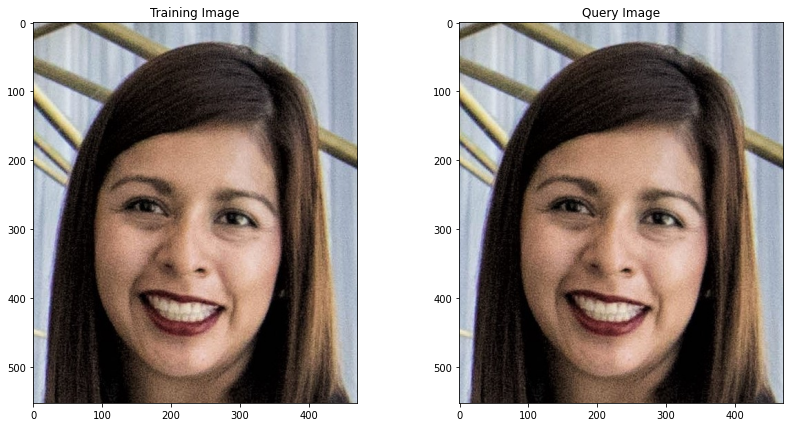

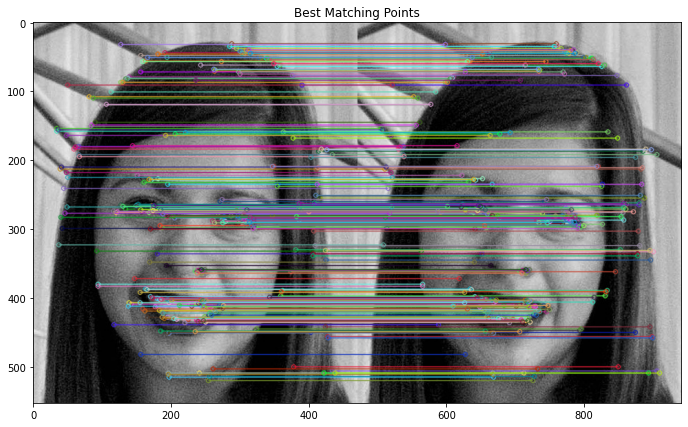

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  821

Number of Matching Keypoints Between The Training and Query Images:  821


In [10]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')

# Load the query image
image2 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the training and query images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 300 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], query_gray, flags = 2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

In [11]:
# Since both the training and query images are same, all keypoints match.

ORBs MAIN PROPERTIES

1. Scale Invariance

2. Rotational Invariance

3. Illumination Invariance

4. Noise Invariance

SCALE INVARIANCE

In [12]:
# The ORB algorithm is scale invariant. This means that it is able to detect objects in 
# images regardless of their size. To see this, we can use BFMatcher to match points 
# b/w the training img and query image that is 1/4th the size of the original training
# image.

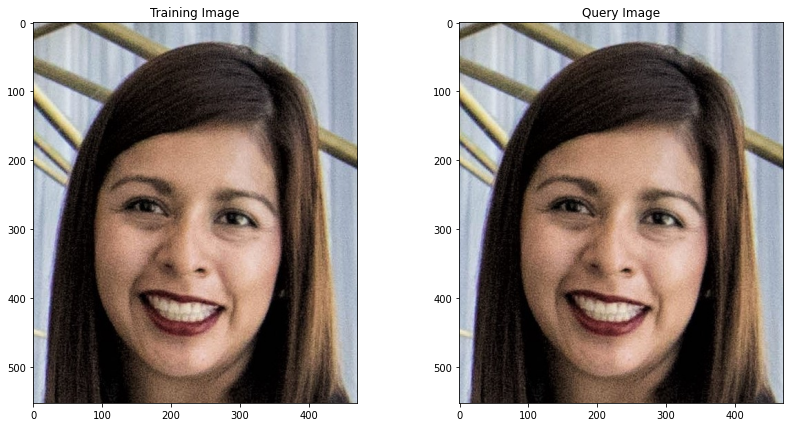

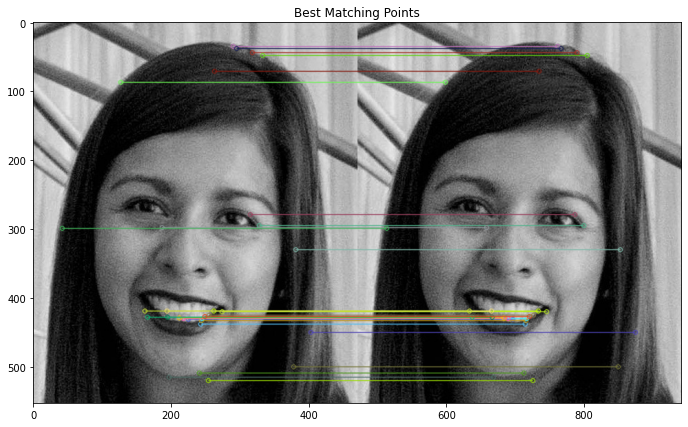


The Training Image has shape: (553, 471)
The Query Image has shape: (553, 471)

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  821

Number of Matching Keypoints Between The Training and Query Images:  821


In [13]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')

# Load the query image
image2 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 30 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:30], query_gray, flags = 2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the shape of the training image
print('\nThe Training Image has shape:', training_gray.shape)

#Print the shape of the query image
print('The Query Image has shape:', query_gray.shape)

# Print the number of keypoints detected in the training image
print("\nNumber of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))


In the above example, the training image is 553 x 471 pixels, while the query image is 138 x 117 pixels, ¼ the size of the original training image. Also, the number of keypoints detected in the query image is only 65, much smaller than the 831 keypoints found in the training image. Our Brute-Force matcher can match most of the keypoints in the query image with their corresponding keypoints in the training image.

ROTATIONAL INVARIANCE

In [14]:
# The ORB algorithm is also rotationally invariant. This means that it is able to
# detect objects in images regardless of their orientation. To see this, we can use 
# Brute force matcher to match points b/w the training image and a query image that 
# has been rotated by 90 degrees.

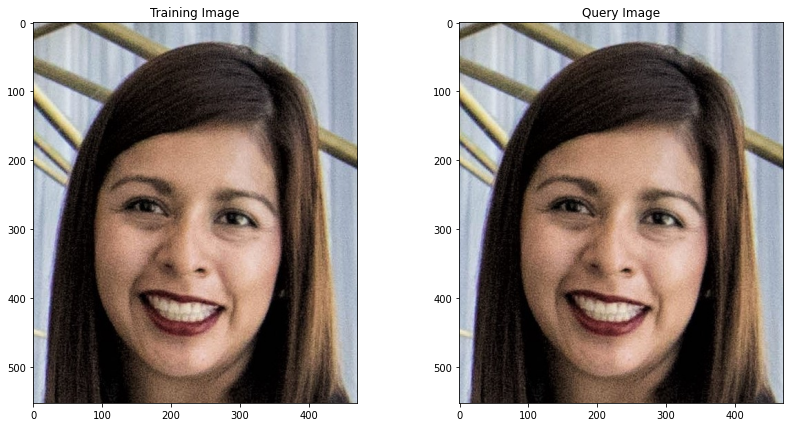

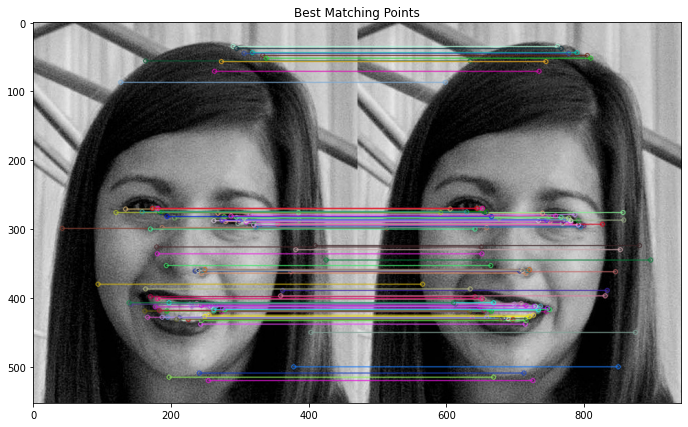


Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  821

Number of Matching Keypoints Between The Training and Query Images:  821


In [15]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')

# Load the query image
image2 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 100 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("\nNumber of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))


The number of keypoints detected in both images is very similar, and that even though the query image is rotated, our Brute-Force matcher can still match about 78% of the keypoints found. Also, most of the matching keypoints are close to particular facial features, such as the eyes, nose, and mouth.

ILLUMINATION INVARIANCE

In [16]:
# The ORB algo is also illumination invariant. This means that it is able to detect
# objects in images regardless of their illumination. To see this, we can use Brute 
# Force matcher to match points b/w the training image and a query image that is much
# brighter

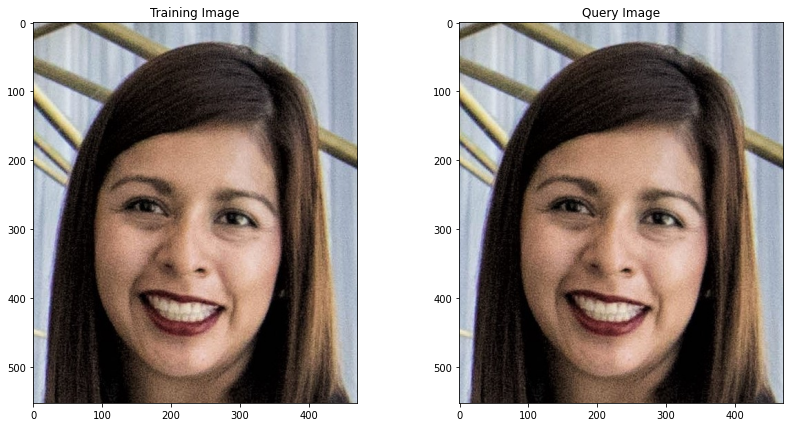

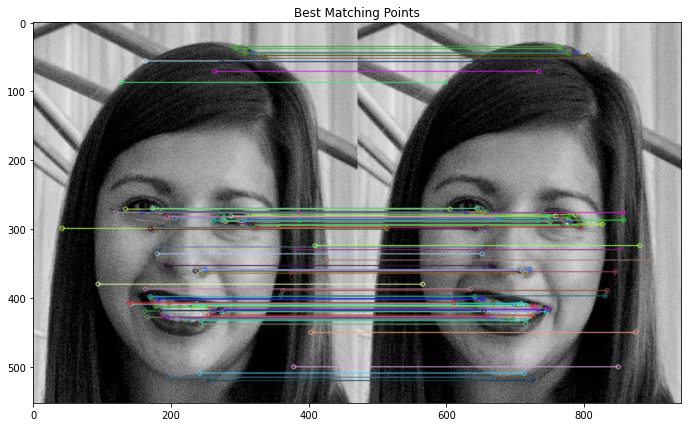


Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  821

Number of Matching Keypoints Between The Training and Query Images:  821


In [17]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')

# Load the query image
image2 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 100 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()


# Print the number of keypoints detected in the training image
print("\nNumber of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

We can see that the number of keypoints detected in both images is again very similar, and that even though the query image is much brighter, our Brute-Force matcher can still match about 63% of the keypoints found.

NOISE INVARIANCE

In [18]:
# The ORB algorithm is also noise invariant. This means that it is able to detect
# objects in images, even if the images have some degree of noise. To see this, we can 
# use Brute Force Matcher to match points b/w training images and a query image that 
# has a lot of noise.

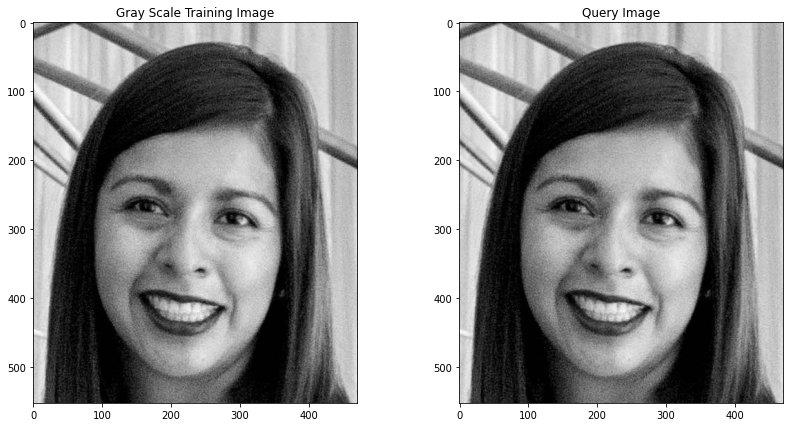

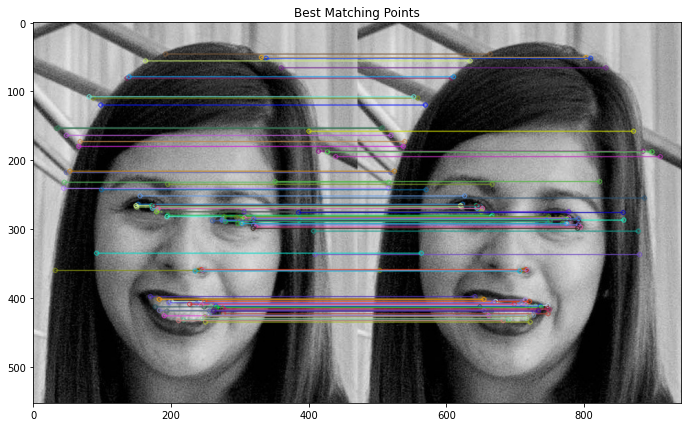

Number of Keypoints Detected In The Training Image:  903
Number of Keypoints Detected In The Query Image:  903

Number of Matching Keypoints Between The Training and Query Images:  903


In [19]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')

# Load the noisy, gray scale query image. 
image2 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/face.jpeg')

# Convert the query image to gray scale
query_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Convert the training image to gray scale
training_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

# Display the images
plt.subplot(121)
plt.imshow(training_gray, cmap = 'gray')
plt.title('Gray Scale Training Image')
plt.subplot(122)
plt.imshow(query_gray, cmap = 'gray')
plt.title('Query Image')
plt.show()

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 1.3)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case. 
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. We set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 100 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# we display the image
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

We can see that the number of keypoints detected in both images is very similar, and that even though the query image has a lot of noise, our Brute-Force matcher can still match about 63% of the keypoints found. Also, notice that most of the matching keypoints are close to particular facial features, such as the eyes, nose, and mouth. In addition, we can see that there are a few features that don’t quite match up, but may have been chosen because of similar patterns of intensity in that area of the image. We will also like to point out that in this case we used a pyramid decimation ratio of 1.3, instead of the of value of 2.0 we used in the previous examples, because in this particular case, it produces better results.

OBJECT DETECTION

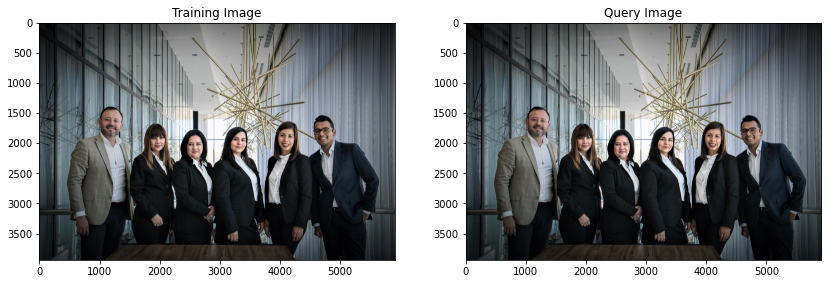

In [20]:
# Implement ORB algorithm to detect the face in the training image and in another image.
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/Team.jpeg')

# Load the query image
image2 = cv2.imread('/content/drive/MyDrive/CV ND /1. Intro to CV/4. Feature Vectors/images/Team.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.imshow(training_image)
plt.title('Training Image')
plt.subplot(122)
plt.imshow(query_image)
plt.title('Query Image')
plt.show()

In [21]:
# in this particualr cse, the training image contains a face, therefore, the majority
# of the keypoints detected are close to facial features, such as eyes, nose and mouth. 
# The query image is of a group of people, one of which is a woman we want to detect.

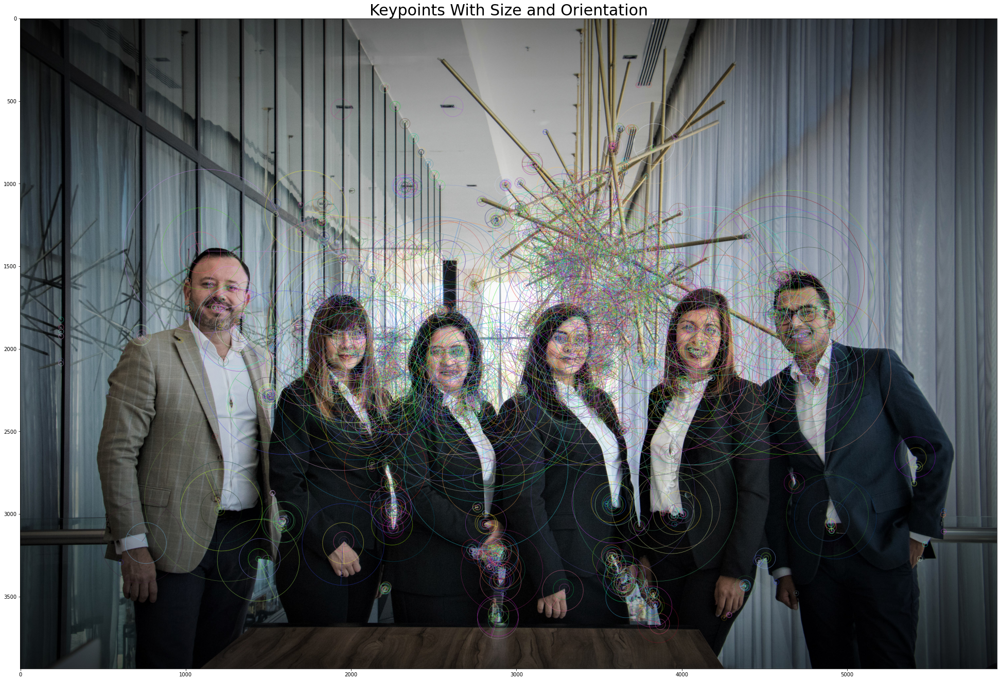


Number of keypoints Detected:  4941


In [22]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(5000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.  
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create copies of the query images to draw our keypoints on
query_img_keyp = copy.copy(query_image)

# Draw the keypoints with size and orientation on the copy of the query image
cv2.drawKeypoints(query_image, keypoints_query, query_img_keyp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the query image with the keypoints with size and orientation
plt.title('Keypoints With Size and Orientation', fontsize = 30)
plt.imshow(query_img_keyp)
plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints Detected: ", len(keypoints_query))


The query image has keypoints in many parts of the image. Now we have keypoints and ORB descriptors of both training and query images and we can use Brute force matcher to try and locate the woman's face in query image.

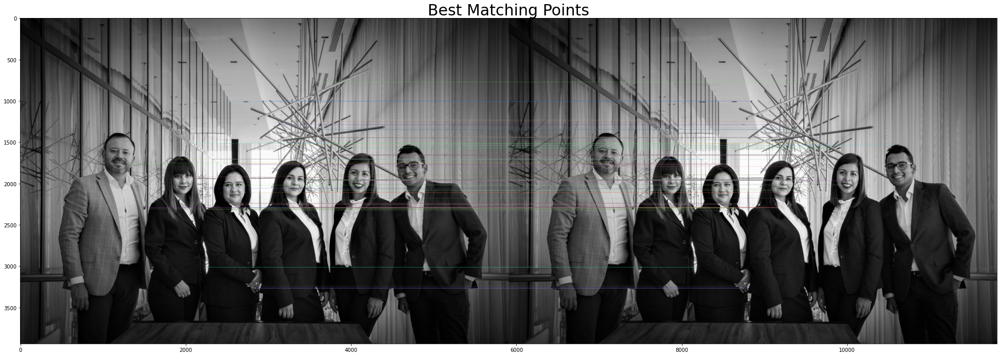

Number of Keypoints Detected In The Training Image:  4941
Number of Keypoints Detected In The Query Image:  4941

Number of Matching Keypoints Between The Training and Query Images:  4941


In [23]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

# Create a Brute Force Matcher object. We set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 85 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.

result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:85], query_gray, flags = 2)

# we display the image
plt.title('Best Matching Points', fontsize = 30)
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching Keypoints between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))